In [1]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load dataset
df = pd.read_csv("../data/accidents.csv")

# Display first five rows
df.head()

,Accident_Index,Accident Date,Month,Day_of_Week,Year,Junction_Control,Junction_Detail,Accident_Severity,Latitude,Light_Conditions,...,Number_of_Casualties,Number_of_Vehicles,Police_Force,Road_Surface_Conditions,Road_Type,Speed_limit,Time,Urban_or_Rural_Area,Weather_Conditions,Vehicle_Type
0,200901BS70001,1/1/2021,Jan,Thursday,2021,Give way or uncontrolled,T or staggered junction,Serious,51.512273,Daylight,...,1,2,Metropolitan Police,Dry,One way street,30,15:11,Urban,Fine no high winds,Car
1,200901BS70002,1/5/2021,Jan,Monday,2021,Give way or uncontrolled,Crossroads,Serious,51.514399,Daylight,...,11,2,Metropolitan Police,Wet or damp,Single carriageway,30,10:59,Urban,Fine no high winds,Taxi/Private hire car
2,200901BS70003,1/4/2021,Jan,Sunday,2021,Give way or uncontrolled,T or staggered junction,Slight,51.486668,Daylight,...,1,2,Metropolitan Police,Dry,Single carriageway,30,14:19,Urban,Fine no high winds,Taxi/Private hire car
3,200901BS70004,1/5/2021,Jan,Monday,2021,Auto traffic signal,T or staggered junction,Serious,51.507804,Daylight,...,1,2,Metropolitan Police,Frost or ice,Single carriageway,30,8:10,Urban,Other,Motorcycle over 500cc
4,200901BS70005,1/6/2021,Jan,Tuesday,2021,Auto traffic signal,Crossroads,Serious,51.482076,Darkness - lights lit,...,1,2,Metropolitan Police,Dry,Single carriageway,30,17:25,Urban,Fine no high winds,Car


In [2]:
# Check dataset size
df.shape

(307973, 23)

In [3]:
# Display column names
df.columns

Index(['Accident_Index', 'Accident Date', 'Month', 'Day_of_Week', 'Year',
       'Junction_Control', 'Junction_Detail', 'Accident_Severity', 'Latitude',
       'Light_Conditions', 'Local_Authority_(District)', 'Carriageway_Hazards',
       'Longitude', 'Number_of_Casualties', 'Number_of_Vehicles',
       'Police_Force', 'Road_Surface_Conditions', 'Road_Type', 'Speed_limit',
       'Time', 'Urban_or_Rural_Area', 'Weather_Conditions', 'Vehicle_Type'],
      dtype='object')

In [4]:
# Dataset information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307973 entries, 0 to 307972
Data columns (total 23 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Accident_Index              307973 non-null  object 
 1   Accident Date               307973 non-null  object 
 2   Month                       307973 non-null  object 
 3   Day_of_Week                 307973 non-null  object 
 4   Year                        307973 non-null  int64  
 5   Junction_Control            307973 non-null  object 
 6   Junction_Detail             307973 non-null  object 
 7   Accident_Severity           307973 non-null  object 
 8   Latitude                    307973 non-null  float64
 9   Light_Conditions            307973 non-null  object 
 10  Local_Authority_(District)  307973 non-null  object 
 11  Carriageway_Hazards         5424 non-null    object 
 12  Longitude                   307973 non-null  float64
 13  Number_of_Casu

In [5]:
# Import GIS mapping library

import folium

# Import MarkerCluster for hotspot grouping
from folium.plugins import MarkerCluster

In [6]:
# Check missing latitude and longitude values
print(df[['Latitude', 'Longitude']].isnull().sum())

Latitude     0
Longitude    0
dtype: int64


In [7]:
# Use smaller sample for visualization
sample_df = df.sample(n=5000, random_state=42)

# Display first rows
sample_df.head()

,Accident_Index,Accident Date,Month,Day_of_Week,Year,Junction_Control,Junction_Detail,Accident_Severity,Latitude,Light_Conditions,...,Number_of_Casualties,Number_of_Vehicles,Police_Force,Road_Surface_Conditions,Road_Type,Speed_limit,Time,Urban_or_Rural_Area,Weather_Conditions,Vehicle_Type
124327,2.01E+12,6/1/2021,Jun,Monday,2021,Data missing or out of range,Not at junction or within 20 metres,Slight,51.360414,Daylight,...,1,1,Kent,Dry,Dual carriageway,30,17:05,Urban,Fine no high winds,Car
65321,200920E008803,1/14/2021,Jan,Wednesday,2021,Give way or uncontrolled,Roundabout,Slight,52.462860,Darkness - lights lit,...,1,2,West Midlands,Wet or damp,Roundabout,40,17:14,Urban,Fine no high winds,Car
64648,200920D177103,7/22/2021,Jul,Wednesday,2021,Data missing or out of range,Not at junction or within 20 metres,Fatal,52.498658,Daylight,...,1,1,West Midlands,Dry,Single carriageway,30,20:10,Urban,Fine no high winds,Car
213149,2.01E+12,2/24/2022,Feb,Wednesday,2022,Data missing or out of range,Not at junction or within 20 metres,Slight,53.795663,Darkness - lighting unknown,...,1,3,West Yorkshire,Dry,Single carriageway,30,18:15,Urban,Fine no high winds,Car
114648,2.01E+12,5/7/2021,May,Thursday,2021,Auto traffic signal,T or staggered junction,Slight,50.945826,Daylight,...,2,2,Hampshire,Dry,Single carriageway,30,11:20,Urban,Fine no high winds,Car


In [8]:
# Create base map centered around average coordinates
accident_map = folium.Map(
    location=[
        sample_df['Latitude'].mean(),
        sample_df['Longitude'].mean()
    ],
    zoom_start=6
)

# Display map
accident_map

In [9]:
# Add accident markers to the map

for index, row in sample_df.iterrows():

    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=2,
        color='red',
        fill=True,
        fill_opacity=0.7
    ).add_to(accident_map)

# Display updated map
accident_map

In [10]:
# Create new map for clustering
cluster_map = folium.Map(
    location=[
        sample_df['Latitude'].mean(),
        sample_df['Longitude'].mean()
    ],
    zoom_start=6
)

# Create marker cluster
marker_cluster = MarkerCluster().add_to(cluster_map)

# Add clustered markers
for index, row in sample_df.iterrows():

    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Severity: {row['Accident_Severity']}"
    ).add_to(marker_cluster)

# Display clustered map
cluster_map

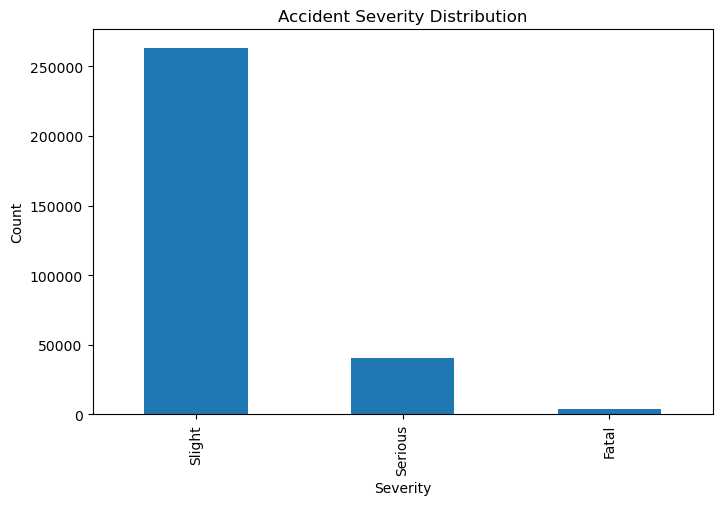

In [12]:
# Visualize accident severity distribution

severity_counts = df['Accident_Severity'].value_counts()

plt.figure(figsize=(8,5))

severity_counts.plot(kind='bar')

plt.title("Accident Severity Distribution")
plt.xlabel("Severity")
plt.ylabel("Count")

plt.show()

## Initial Conclusion

Initial GIS-based exploratory analysis was successfully performed using the road accident dataset. Accident locations were visualized geographically using Folium maps, and hotspot clustering techniques were applied to identify high-density accident regions.

This project demonstrates the use of geospatial visualization and GIS-based analytical techniques for public safety monitoring and accident hotspot analysis.

In [13]:
# Import KMeans clustering algorithm
from sklearn.cluster import KMeans

# Select latitude and longitude for clustering
location_data = sample_df[['Latitude', 'Longitude']]

# Create KMeans model with 5 hotspot clusters
kmeans = KMeans(n_clusters=5, random_state=42)

# Fit model and assign cluster labels
sample_df['Cluster'] = kmeans.fit_predict(location_data)

# Display first rows with cluster labels
sample_df[['Latitude', 'Longitude', 'Accident_Severity', 'Cluster']].head()

C:\Users\Sanjula\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\Sanjula\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
        "wmic CPU Get NumberOfCores /Format:csv".split(),
        capture_output=True,
        text=True,
    )
  File "C:\Users\Sanjula\anaconda3\Lib\subprocess.py", line 554, in run
    with Popen(*popenargs, **kwargs) as process:
         ~~~~~^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\Sanjula\anaconda3\Lib\subprocess.py", line 1039, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
    ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^

,Latitude,Longitude,Accident_Severity,Cluster
124327,51.360414,1.395073,Slight,1
65321,52.462860,-1.887075,Slight,2
64648,52.498658,-1.773410,Fatal,2
213149,53.795663,-1.802003,Slight,3
114648,50.945826,-1.462045,Slight,1


In [14]:
# Create hotspot cluster map
hotspot_map = folium.Map(
    location=[sample_df['Latitude'].mean(), sample_df['Longitude'].mean()],
    zoom_start=6
)

# Add clustered accident points
for index, row in sample_df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        popup=f"Severity: {row['Accident_Severity']} | Cluster: {row['Cluster']}",
        fill=True,
        fill_opacity=0.7
    ).add_to(hotspot_map)

# Display hotspot map
hotspot_map

In [15]:
# Count accidents in each cluster
sample_df['Cluster'].value_counts()

Cluster
1    1985
3    1133
2    1100
0     601
4     181
Name: count, dtype: int64

## Hotspot Clustering Conclusion

KMeans clustering was applied using latitude and longitude values to identify accident hotspot groups. Five hotspot clusters were generated from the accident location data.

Cluster 1 recorded the highest number of accidents, indicating that this region represents the most accident-dense hotspot in the selected sample. This type of GIS-based clustering can support public safety analysis, accident prevention planning, and location-based decision-making.